## Data Expression Recovery - Denoising and Imputation

In [1]:
rm(list=ls())
library(SAVER)
library(Seurat)
library(dplyr)
library(tidyr)
library(cowplot)
library(Matrix)
library(cowplot) 
library(gridExtra)
library(dplyr)
library(clustree)
library(DT)
library(pheatmap)
library(RColorBrewer)
library(ggplot2)
library(pracma)
options(mc.cores = 64)


Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



********************************************************

Note: As of version 1.0.0, cowplot does not change the

  default ggplot2 theme anymore. To recover the previous

  behavior, execute:
  theme_set(theme_cowplot())

********************************************************



Attaching package: 'Matrix'


The following objects are masked from 'package:tidyr':

    expand, pack, unpack



Attaching package: 'gridExtra'


The following object is masked from 'package:dplyr':

    combine


Loading required package: ggraph

Loading required package: ggplot2


Attaching package: 'DT'


The following object is masked from 'package:Seurat':

    JS



Attaching package: 'pracma'


The following objects are masked from 'package:Matrix':

    expm, lu, tril, triu




### SAVER

In [94]:
# scdata<-readRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.noc.Rds")
scdata <- readRDS(file = '/mnt/isilonX200/scRNA/Project_1/Result/CL10P.qc.Rds')

In [4]:
dim(scdata)

[1] 33538  3403

In [103]:
data.frame(scdata@assays$RNA@counts)[Genelist,]
data.frame(scdata@assays$RNA[Genelist,])
data.frame(scdata@assays$logCPM@counts)[Genelist,]
data.frame(scdata@assays$logCPM[Genelist,])

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HSPA8,2,1,6,4,4,0,2,1,0,4,...,4,0,1,5,1,2,1,1,2,3
POLR2L,10,20,9,12,9,24,19,5,10,5,...,9,2,20,12,19,11,15,11,14,23
HIST1H4C,41,251,76,37,176,105,81,81,211,120,...,86,2,40,40,117,29,54,64,16,169
MALAT1,177,284,582,462,542,673,486,371,343,149,...,872,90,348,41,687,227,979,892,422,935


,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HSPA8,2,1,6,4,4,0,2,1,0,4,...,4,0,1,5,1,2,1,1,2,3
POLR2L,10,20,9,12,9,24,19,5,10,5,...,9,2,20,12,19,11,15,11,14,23
HIST1H4C,41,251,76,37,176,105,81,81,211,120,...,86,2,40,40,117,29,54,64,16,169
MALAT1,177,284,582,462,542,673,486,371,343,149,...,872,90,348,41,687,227,979,892,422,935


,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HSPA8,2,1,6,4,4,0,2,1,0,4,...,4,0,1,5,1,2,1,1,2,3
POLR2L,10,20,9,12,9,24,19,5,10,5,...,9,2,20,12,19,11,15,11,14,23
HIST1H4C,41,251,76,37,176,105,81,81,211,120,...,86,2,40,40,117,29,54,64,16,169
MALAT1,177,284,582,462,542,673,486,371,343,149,...,872,90,348,41,687,227,979,892,422,935


,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HSPA8,0.4529952,0.1591916,0.7782667,0.5300442,0.5058686,0.000000,0.3373833,0.2549605,0.000000,0.7085451,...,0.6641281,0.000000,0.1970642,0.9259995,0.2110987,0.388194,0.194344,0.187213,0.3594719,0.3740082
POLR2L,1.3519832,1.4931852,1.0175981,1.1304411,0.9088459,1.623301,1.5711383,0.8969257,1.092635,0.8280245,...,1.1382466,1.775081,1.6783004,1.5387014,1.6984830,1.283358,1.439292,1.183176,1.3932722,1.4989999
HIST1H4C,2.5452835,3.7912826,2.7674168,2.0103351,3.4002208,2.934142,2.8479095,3.1996221,3.757070,3.4635781,...,3.0573028,1.775081,2.2734537,2.5798472,3.3498690,2.064021,2.532407,2.651592,1.4952792,3.2790270
MALAT1,3.9456893,3.9121783,4.7469854,4.4034867,4.5022139,4.746009,4.5901589,4.6889813,4.233915,3.6739186,...,5.3304432,5.400577,4.3412324,2.6026897,5.0904841,4.004326,5.351902,5.218455,4.5247499,4.9583317


In [134]:
cortex<-scdata@assays$RNA@counts

In [135]:
str(cortex)

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:19018835] 14 21 22 26 27 39 41 43 45 47 ...
  ..@ p       : int [1:3404] 0 5160 11462 17128 23540 29982 36331 42392 47437 53533 ...
  ..@ Dim     : int [1:2] 33538 3403
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:33538] "MIR1302-2HG" "FAM138A" "OR4F5" "AL627309.1" ...
  .. ..$ : chr [1:3403] "AAACCTGAGGATATAC-CL1-0-P-4" "AAACCTGAGGGTCTCC-CL1-0-P-4" "AAACCTGCACATTTCT-CL1-0-P-4" "AAACGGGGTCCCTACT-CL1-0-P-4" ...
  ..@ x       : num [1:19018835] 1 2 1 43 13 8 1 5 2 1 ...
  ..@ factors : list()


In [136]:
cortex.saver <- saver(cortex, ncores = 64)

33538 genes, 3403 cells

Running SAVER with 64 worker(s)

Calculating predictions for 21722 genes using 10780 genes and 3403 cells...

Start time: 2020-05-05 08:05:32

Estimating finish time...

Finished 64/33538 genes. Approximate finish time: 2020-05-05 08:09:34

Calculating max cor cutoff...

Finished 100/33538 genes. Approximate finish time: 2020-05-05 08:13:50

Calculating lambda coefficients...

Finished 313/33538 genes. Approximate finish time: 2020-05-05 08:20:07

Predicting remaining genes...

Finished 5666/33538 genes. Approximate finish time: 2020-05-05 09:04:22

Predicting remaining genes...

Finished 21722/33538 genes. Approximate finish time: 2020-05-05 09:01:35

Estimating remaining 11816 genes.

Done!

Finish time: 2020-05-05 09:02:17

Total time: 56.75354 mins



In [137]:
str(cortex.saver)

List of 3
 $ estimate: num [1:33538, 1:3403] 0 0 0 0.008 0 0 0 0 0 0 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:33538] "MIR1302-2HG" "FAM138A" "OR4F5" "AL627309.1" ...
  .. ..$ : chr [1:3403] "AAACCTGAGGATATAC-CL1-0-P-4" "AAACCTGAGGGTCTCC-CL1-0-P-4" "AAACCTGCACATTTCT-CL1-0-P-4" "AAACGGGGTCCCTACT-CL1-0-P-4" ...
 $ se      : num [1:33538, 1:3403] 0 0 0 0.031 0 0 0 0 0 0 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:33538] "MIR1302-2HG" "FAM138A" "OR4F5" "AL627309.1" ...
  .. ..$ : chr [1:3403] "AAACCTGAGGATATAC-CL1-0-P-4" "AAACCTGAGGGTCTCC-CL1-0-P-4" "AAACCTGCACATTTCT-CL1-0-P-4" "AAACGGGGTCCCTACT-CL1-0-P-4" ...
 $ info    :List of 10
  ..$ size.factor : num [1:3403] 0.743 1.233 1.084 1.217 1.293 ...
  ..$ maxcor      : num [1:33538] 2 2 2 0.114 2 ...
  ..$ lambda.max  : num [1:33538] 0 0 0 0.0157 0 ...
  ..$ lambda.min  : num [1:33538] 0 0 0 0.00553 0 ...
  ..$ sd.cv       : num [1:33538] 0 0 0 NA 0 0 0 0 0 0 ...
  ..$ pred.time   : num [1:33538] 1.63e-04 1.49e

In [140]:
saveRDS(object=cortex.saver, "/mnt/isilonX200/scRNA/Project_1/Result/CL10P.saver.Rds")
# saveRDS(object=cortex.saver, "/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.noc.saver.Rds")
# cortex.saver <- readRDS("/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.noc.saver.Rds")

In [11]:
str(scdata)

Formal class 'Seurat' [package "Seurat"] with 12 slots
  ..@ assays      :List of 2
  .. ..$ RNA   :Formal class 'Assay' [package "Seurat"] with 8 slots
  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:19018835] 14 21 22 26 27 39 41 43 45 47 ...
  .. .. .. .. .. ..@ p       : int [1:3404] 0 5160 11462 17128 23540 29982 36331 42392 47437 53533 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 33538 3403
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:33538] "MIR1302-2HG" "FAM138A" "OR4F5" "AL627309.1" ...
  .. .. .. .. .. .. ..$ : chr [1:3403] "AAACCTGAGGATATAC-CL1-0-P-4" "AAACCTGAGGGTCTCC-CL1-0-P-4" "AAACCTGCACATTTCT-CL1-0-P-4" "AAACGGGGTCCCTACT-CL1-0-P-4" ...
  .. .. .. .. .. ..@ x       : num [1:19018835] 1 2 1 43 13 8 1 5 2 1 ...
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:

### Normal Seurat

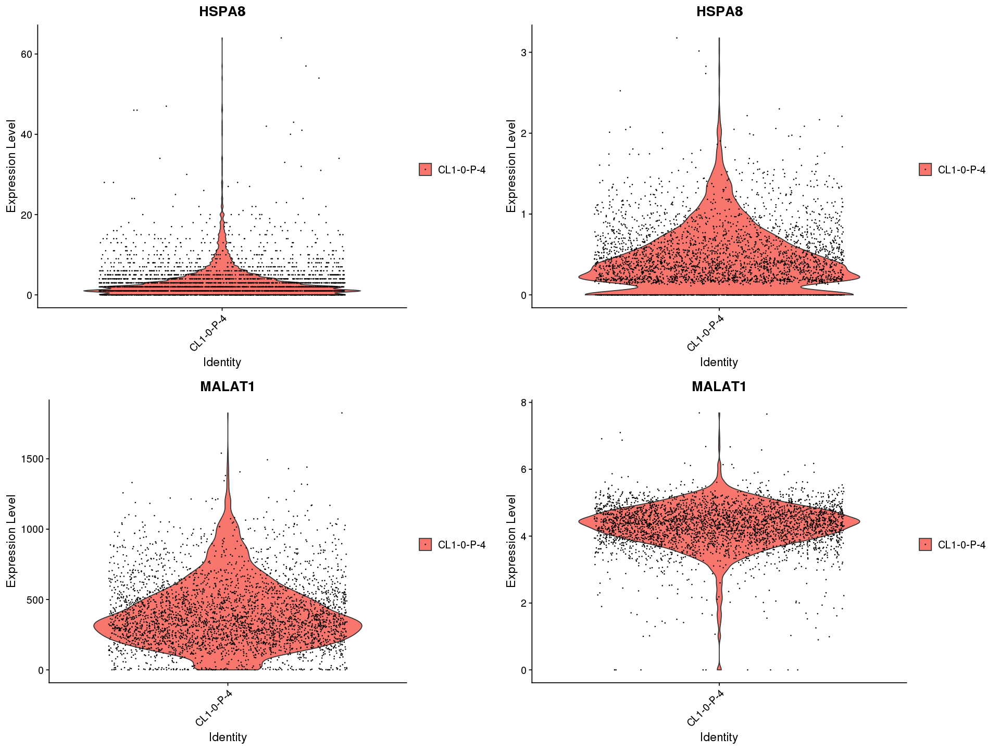

In [27]:
options(repr.plot.width = 16, repr.plot.height = 12)
# S100A8, S100A9, MMP1, COL1A1, COL1A2, CXCL8, CD55
plot_grid(
VlnPlot(scdata, 'HSPA8', assay = "RNA", pt.size = 0.1, group.by = 'condition'),
VlnPlot(scdata, 'HSPA8', assay = "logCPM", pt.size = 0.1, group.by = 'condition'),
VlnPlot(scdata, 'MALAT1', assay = "RNA", pt.size = 0.1, group.by = 'condition'),
VlnPlot(scdata, 'MALAT1', assay = "logCPM", pt.size = 0.1, group.by = 'condition'), ncol = 2)

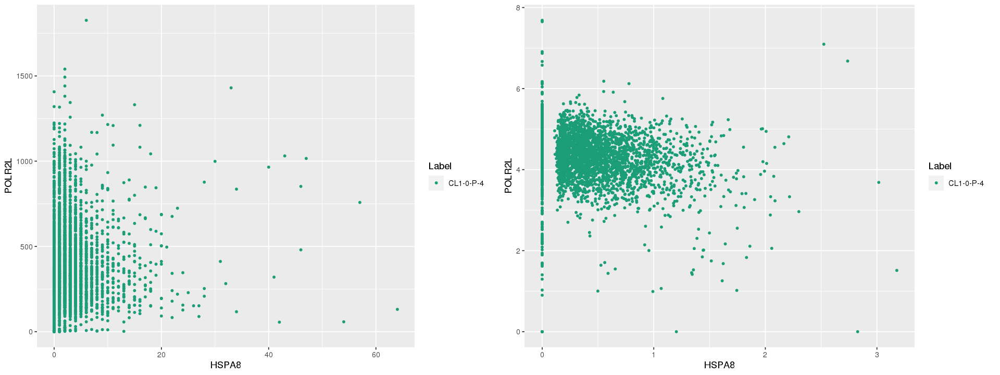

In [95]:
options(repr.plot.width=16, repr.plot.height=6)
Label <- scdata$condition
Genelist <- c('HSPA8', 'POLR2L', "HIST1H4C", "MALAT1")
# Genelist <- c('S100A8', 'S100A9', 'MMP1', 'COL1A1', 'COL1A2', 'CXCL8', 'CD55')
plot_grid(
ggplot(data.frame(t(scdata@assays$RNA[Genelist, ]), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]),
ggplot(data.frame(t(scdata@assays$logCPM[Genelist, ]), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]), ncol=2)

### Saver Seurat

In [16]:
sscdata <- scdata

In [17]:
sscdata@assays$saver <- cortex.saver

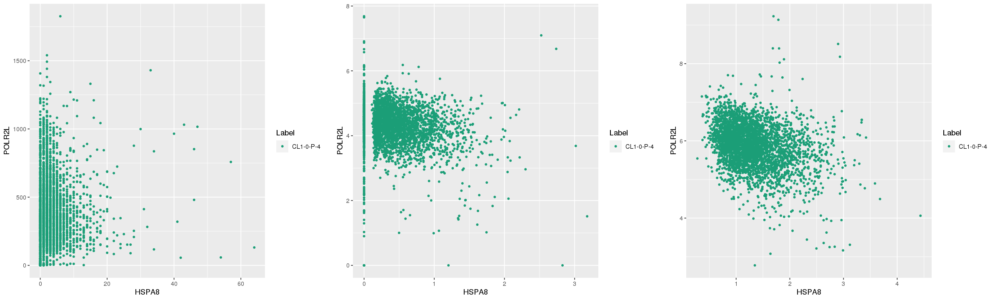

In [31]:
options(repr.plot.width=20, repr.plot.height=6)
Label <- scdata$condition
Genelist <- c('HSPA8', 'POLR2L', "HIST1H4C", "MALAT1")
# Genelist <- c('S100A8', 'S100A9', 'MMP1', 'COL1A1', 'COL1A2', 'CXCL8', 'CD55')
plot_grid(
ggplot(data.frame(t(sscdata@assays$RNA[Genelist, ]), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]),
ggplot(data.frame(t(sscdata@assays$logCPM[Genelist, ]), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]), 
ggplot(data.frame(t(log(sscdata@assays$saver$estimate[Genelist, ]+1)), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]), ncol=3)

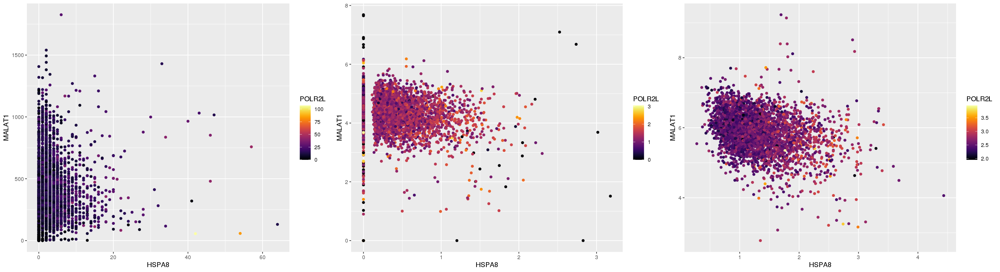

In [66]:
options(repr.plot.width=22, repr.plot.height=6)
plot_grid(ggplot(data.frame(t(sscdata@assays$RNA[Genelist, ]))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ggplot(data.frame(t(sscdata@assays$logCPM[Genelist, ]))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ggplot(data.frame(t(log(sscdata@assays$saver$estimate[Genelist, ]+1)))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"), ncol=3)

In [36]:
log(sscdata@assays$saver$estimate[Genelist, ]+1)

,AAACCTGAGGATATAC-CL1-0-P-4,AAACCTGAGGGTCTCC-CL1-0-P-4,AAACCTGCACATTTCT-CL1-0-P-4,AAACGGGGTCCCTACT-CL1-0-P-4,AAACGGGTCACCATAG-CL1-0-P-4,AAACGGGTCAGCACAT-CL1-0-P-4,AAACGGGTCTATCCCG-CL1-0-P-4,AAACGGGTCTGACCTC-CL1-0-P-4,AAAGATGAGAGGTTGC-CL1-0-P-4,AAAGATGAGCGGCTTC-CL1-0-P-4,...,TTTGGTTCAGGGTACA-CL1-0-P-4,TTTGGTTCATCTCCCA-CL1-0-P-4,TTTGGTTTCGGCTACG-CL1-0-P-4,TTTGTCAGTAATTGGA-CL1-0-P-4,TTTGTCAGTACATGTC-CL1-0-P-4,TTTGTCAGTCTCAACA-CL1-0-P-4,TTTGTCAGTGGCCCTA-CL1-0-P-4,TTTGTCAGTTACGACT-CL1-0-P-4,TTTGTCATCCATGAAC-CL1-0-P-4,TTTGTCATCTGGTTCC-CL1-0-P-4
HSPA8,1.026042,0.9719146,1.761128,1.512266,1.028905,0.6168059,0.678541,0.8055826,0.7957038,1.211941,...,0.8051357,1.358923,1.160021,2.051299,1.320689,1.477277,0.8042412,0.6280752,1.051870,1.103268
POLR2L,2.562870,2.7595035,2.557150,2.522684,2.377785,2.8788051,2.801905,2.2740827,2.4632573,2.495517,...,2.4824035,2.893921,2.748680,2.918905,3.069772,2.562176,2.6092606,2.4748563,2.563101,2.732873
HIST1H4C,4.132908,5.3134818,4.296169,3.463139,4.919148,4.4473344,4.373276,4.7000621,5.2805912,4.951586,...,4.5921559,3.639479,3.714401,4.049870,4.857935,3.510201,4.0531927,4.1615046,2.889482,4.817827
MALAT1,5.496463,5.4528608,6.286343,5.934976,6.039905,6.2817040,6.131865,6.2275638,5.7743745,5.217649,...,6.8699246,6.875503,5.879141,4.195049,6.631804,5.547479,6.8943346,6.7592657,6.060001,6.500557


## scImpute

In [124]:
library(scImpute)
packageVersion("scImpute")

Loading required package: parallel

Loading required package: penalized

Loading required package: survival

Welcome to penalized. For extended examples, see vignette("penalized").

Loading required package: doParallel

Loading required package: foreach

Loading required package: iterators



[1] '0.0.9'

In [110]:
# saveRDS(data.frame(scdata@assays$logCPM[]), "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count_logCPM.Rds")
# write.csv(cortex, "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count.csv")
# saveRDS(cortex, "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count.rds")

In [59]:
scimpute(# full path to raw count matrix
        count_path = "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count.csv", 
        infile = "csv",           # format of input file
        outfile = "rds",          # format of output file
        out_dir = "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/scimpute",           # full path to output directory
        labeled = FALSE,          # cell type labels not available
        drop_thre = 0.5,          # threshold set on dropout probability
        Kcluster = 2,             # 2 cell subpopulations
        ncores = 64)         

[1] "reading in raw count matrix ..."
[1] "number of genes in raw count matrix 33538"
[1] "number of cells in raw count matrix 3403"
[1] "reading finished!"
[1] "imputation starts ..."
[1] "searching candidate neighbors ... "
[1] "inferring cell similarities ..."
[1] "dimension reduction ..."
[1] "calculating cell distances ..."
[1] "cluster sizes:"
[1]  106 3163
[1] "estimating dropout probability for type 1 ..."
[1] "searching for valid genes ..."
[1] "imputing dropout values for type 1 ..."
[1] "estimating dropout probability for type 2 ..."
[1] "searching for valid genes ..."
[1] "imputing dropout values for type 2 ..."
[1] "writing imputed count matrix ..."


In [150]:
cortex.scimpute <- readRDS("/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/scimputescimpute_count.rds")

In [151]:
cortex.scimpute[1:5,1:10]

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,0


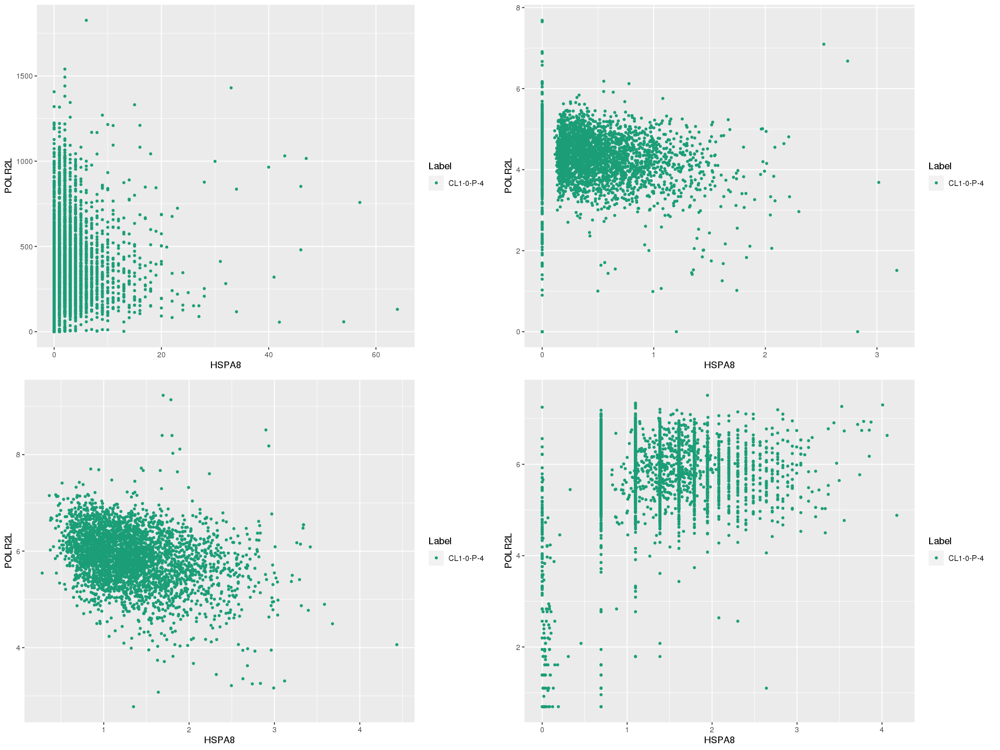

In [65]:
library(ggplot2)
options(repr.plot.width=16, repr.plot.height=12)
Label <- scdata$condition
Genelist <- c('HSPA8', 'POLR2L', "HIST1H4C", "MALAT1")
plot_grid(
ggplot(data.frame(t(sscdata@assays$RNA[Genelist, ]), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]),
ggplot(data.frame(t(sscdata@assays$logCPM[Genelist, ]), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]), 
ggplot(data.frame(t(log(sscdata@assays$saver$estimate[Genelist, ]+1)), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]), 
ggplot(data.frame(t(log(cortex.scimpute[Genelist, ]+1)), Label = Label), aes(HSPA8, MALAT1, color = Label)) + #xlim(0, 50) + ylim(0, 50) +
       scale_color_brewer(palette = "Dark2")+ 
       geom_point(size = 1) + 
       labs(x = Genelist[1], y = Genelist[2]), ncol=2)

In [152]:
str(cortex.scimpute)

 num [1:33538, 1:3403] 0 0 0 0 0 0 0 0 0 0 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:33538] "MIR1302-2HG" "FAM138A" "OR4F5" "AL627309.1" ...
  ..$ : chr [1:3403] "AAACCTGAGGATATAC.CL1.0.P.4" "AAACCTGAGGGTCTCC.CL1.0.P.4" "AAACCTGCACATTTCT.CL1.0.P.4" "AAACGGGGTCCCTACT.CL1.0.P.4" ...


In [153]:
cortex.scimpute.normalize <- library.size.normalize(cortex.scimpute+1)
# bmmsc <- sqrt(bmmsc)

In [154]:
head(cortex.scimpute.normalize)

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
MIR1302-2HG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FAM138A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OR4F5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AL627309.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.005657854,0
AL627309.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AL627309.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


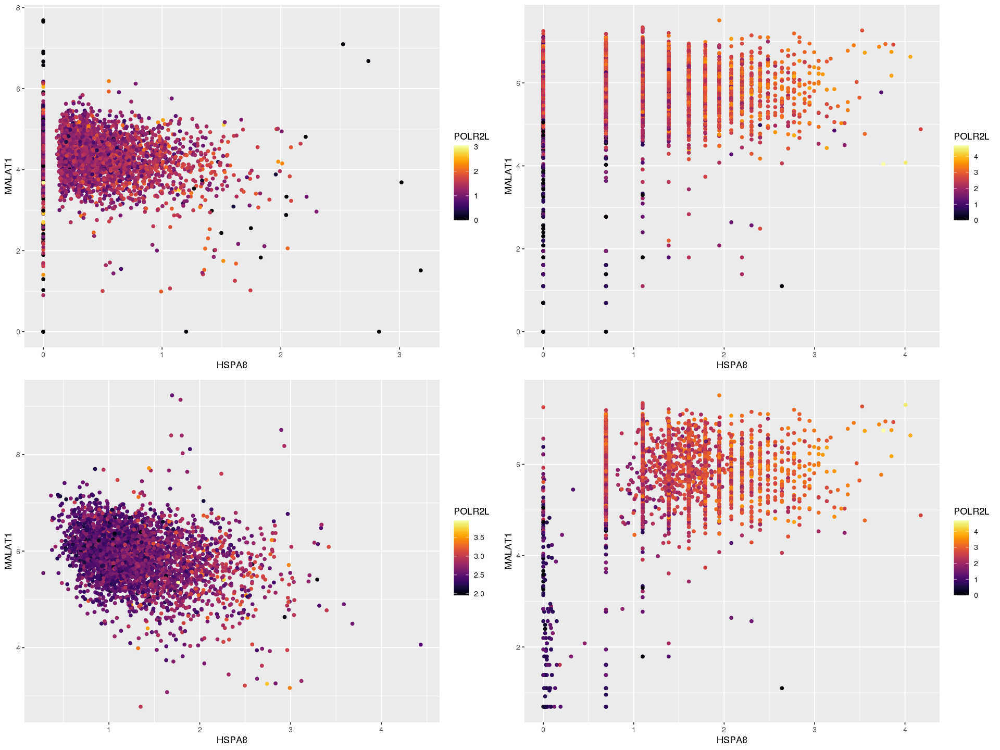

In [158]:
options(repr.plot.width=16, repr.plot.height=12)
plot_grid(ggplot(data.frame(t(scdata@assays$logCPM[Genelist, ]))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ggplot(data.frame(t(log(scdata@assays$RNA[Genelist, ]+1)))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ggplot(data.frame(t(log(cortex.saver$estimate[Genelist, ]+1)))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ggplot(data.frame(t(log(cortex.scimpute+1)))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ncol=2)

## MAGIC

In [12]:
library(Rmagic)


Attaching package: 'Rmagic'


The following object is masked from 'package:pracma':

    magic




In [19]:
# write.csv(cortex.logCPM, "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10_logCPM.csv")
# cortex.magic.logCPM <- read.csv("/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10_logCPM.csv")

In [111]:
# saveRDS(cortex.magic.logCPM, "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10_logCPM.rds")
# cortex.magic.logCPM<-readRDS("/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10_logCPM.rds")
# cortex.magic.logCPM<-read.csv("/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count.csv")
cortex.magic.logCPM<-readRDS("/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count_logCPM.Rds")

In [112]:
cortex.magic.logCPM[1:5,1:10]

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,0


In [116]:
data_MAGIC <- magic(data.frame(t(cortex.magic.logCPM)), knn=15, genes=c('HSPA8', 'POLR2L', "HIST1H4C", "MALAT1"))

In [117]:
head(data_MAGIC$result)

,HIST1H4C,POLR2L,MALAT1,HSPA8
,<dbl>,<dbl>,<dbl>,<dbl>
AAACCTGAGGATATAC.CL1.0.P.4,2.853601,1.239322,4.431920,0.3141991
AAACCTGAGGGTCTCC.CL1.0.P.4,3.133203,1.231664,4.380478,0.3230968
AAACCTGCACATTTCT.CL1.0.P.4,2.736096,1.133203,4.327349,0.3773281
AAACGGGGTCCCTACT.CL1.0.P.4,2.351925,1.275361,4.258791,0.5011147
AAACGGGTCACCATAG.CL1.0.P.4,3.162644,1.224732,4.418360,0.3194761
AAACGGGTCAGCACAT.CL1.0.P.4,2.787211,1.315262,4.353888,0.3051679


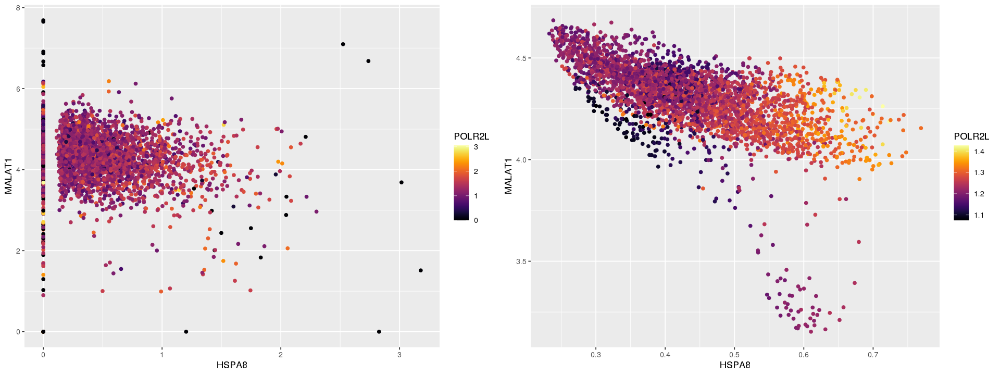

In [122]:
options(repr.plot.width=16, repr.plot.height=6)
plot_grid(ggplot(data.frame(t(cortex.magic.logCPM))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ggplot(data_MAGIC) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B"),
          ncol=2)

## scTSSR

In [31]:
library(scTSSR)

In [32]:
data("baron")
head(baron)

,GATGACGGAC-GGTGGGAT 1 1,GAGCGTTGCT-ACCTTCTT 2 2,CTTACGGG-CCATTACT 3 3,GATGTACACG-TTAAACTG 4 4,GAGATTGCGA-GTCGTCGT 5 5,AATCCCACG-ATTCGACG 6 6,AAAATCGTT-CTCCGCAT 7 7,GACTCTTGAC-AAACTGGT 8 8,GAGAATTCGT-GTTTGTTT 9 9,AGAAGTCC-CCGCTGTT 10 10,...,ATATGCAT-CTGCGTTG 1067 1067,GAACCACGCT-TCACGTTT 1068 1068,ACCCGACTT-GCCTCTTT 1069 1069,TGACCTGTTAT-CCCGACTT 1070 1070,GATGACCCTC-CCGCAACT 1071 1071,ATTGTGACT-CGCTAATA 1072 1072,GATCTCAACC-TTTACCCT 1073 1073,CAGTTTGC-GTTCTGTT 1074 1074,GAATGGGCAC-GATGTATT 1075 1075,GAGGTCCCTT-CCACATTA 1076 1076
AARS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
ABCC8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
ABCD3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABHD12,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABHD17A,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABHD2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABI2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
ACAA2,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
ACADVL,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ACAT1,0,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
head(baron$count.samp)

,GATGACGGAC-GGTGGGAT 1 1,GAGCGTTGCT-ACCTTCTT 2 2,CTTACGGG-CCATTACT 3 3,GATGTACACG-TTAAACTG 4 4,GAGATTGCGA-GTCGTCGT 5 5,AATCCCACG-ATTCGACG 6 6,AAAATCGTT-CTCCGCAT 7 7,GACTCTTGAC-AAACTGGT 8 8,GAGAATTCGT-GTTTGTTT 9 9,AGAAGTCC-CCGCTGTT 10 10,...,ATATGCAT-CTGCGTTG 1067 1067,GAACCACGCT-TCACGTTT 1068 1068,ACCCGACTT-GCCTCTTT 1069 1069,TGACCTGTTAT-CCCGACTT 1070 1070,GATGACCCTC-CCGCAACT 1071 1071,ATTGTGACT-CGCTAATA 1072 1072,GATCTCAACC-TTTACCCT 1073 1073,CAGTTTGC-GTTCTGTT 1074 1074,GAATGGGCAC-GATGTATT 1075 1075,GAGGTCCCTT-CCACATTA 1076 1076
AARS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
ABCC8,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
ABCD3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABHD12,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABHD17A,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABHD2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
cortex.scTSSR <- read.csv("/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P_count.csv")
rownames(cortex.scTSSR) <- cortex.scTSSR$X
cortex.scTSSR <- cortex.scTSSR[,-1]
head(cortex.scTSSR)

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,...,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
MIR1302-2HG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AL627309.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [54]:
CL10P_imputation_result <- scTSSR(cortex.scTSSR, percent=0.05, learning_rate=0.0001, epochs=100, run_batch=FALSE)

Calculating the penalty parameter lambda ...

Done!

Starting preprocessing and log-normalization ...

Done!

Imputation starts ...

Calculating the prior mean for each gene in each cell ...

iter objective

1    4649108.775

2    4406243.424

3    4653701.86

4    4813711.834

Calculating the posterior means with 1 worker(s)

11910 genes, 3403 cells

Running SAVER given prior means with 1 worker(s)

Start time: 2020-05-04 11:14:02

Estimating finish time...

Finished 100/11910 genes. Approximate finish time: 2020-05-04 11:32:38

Finished 3053/11910 genes. Approximate finish time: 2020-05-04 11:32:09

Finished 6005/11910 genes. Approximate finish time: 2020-05-04 11:32:11

Finished 8958/11910 genes. Approximate finish time: 2020-05-04 11:32:04

Finished 11910/11910 genes. Approximate finish time: 2020-05-04 11:31:56

Done!

Finish time: 2020-05-04 11:31:56

Total time: 17.8952 mins

Done!

Finish time: 2020-05-04 11:31:56

Total time: 1.474455 hours



In [59]:
str(CL10P_imputation_result)

List of 5
 $ estimate: num [1:11910, 1:3403] 0.296 0.144 0.113 0.058 0.07 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:11910] "AL669831.5" "LINC00115" "AL645608.3" "AL645608.5" ...
  .. ..$ : chr [1:3403] "AAACCTGAGGATATAC.CL1.0.P.4" "AAACCTGAGGGTCTCC.CL1.0.P.4" "AAACCTGCACATTTCT.CL1.0.P.4" "AAACGGGGTCCCTACT.CL1.0.P.4" ...
 $ A       : num [1:11910, 1:11910] 0 0 0 0 0 ...
 $ B       : num [1:3403, 1:3403] 0 0.000183 0.000396 0.000311 0.000452 ...
 $ se      : num [1:11910, 1:3403] 0.124 0.079 0.115 0.07 0.087 0.793 0.994 0.072 0.064 0.031 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:11910] "AL669831.5" "LINC00115" "AL645608.3" "AL645608.5" ...
  .. ..$ : chr [1:3403] "AAACCTGAGGATATAC.CL1.0.P.4" "AAACCTGAGGGTCTCC.CL1.0.P.4" "AAACCTGCACATTTCT.CL1.0.P.4" "AAACGGGGTCCCTACT.CL1.0.P.4" ...
 $ info    :List of 4
  ..$ size.factor   : num [1:3403] 0.743 1.233 1.084 1.218 1.293 ...
  ..$ pred.time     : 'difftime' num 1.17558123118348
  .. ..- attr(*, "units")= chr "h

In [62]:
# saveRDS(CL10P_imputation_result, "/home/woror000/Project/Training/R/Singal_Cell/ExpressionRecovery/CL10P.scTSSR.rds")

In [63]:
head(CL10P_imputation_result$estimate)

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
AL669831.5,0.296,0.350,0.284,0.291,0.353,0.287,0.296,0.397,0.291,0.296,...,0.347,0.276,0.300,0.285,0.300,0.287,0.308,0.408,0.292,0.294
LINC00115,0.144,0.097,0.098,0.099,0.097,0.096,0.098,0.099,0.099,0.098,...,0.099,0.101,0.099,0.099,0.099,0.101,0.100,0.098,0.098,0.098
AL645608.3,0.113,0.222,0.108,0.106,0.107,0.105,0.110,0.112,0.109,0.113,...,0.112,0.119,0.231,0.114,0.116,0.110,0.112,0.111,0.113,0.218
AL645608.5,0.058,0.137,0.056,0.056,0.056,0.056,0.057,0.058,0.057,0.059,...,0.058,0.060,0.058,0.058,0.059,0.057,0.058,0.057,0.058,0.137
AL645608.1,0.070,0.067,0.067,0.066,0.066,0.065,0.068,0.069,0.068,0.070,...,0.069,0.074,0.174,0.070,0.072,0.068,0.069,0.068,0.069,0.067
SAMD11,0.763,0.817,1.159,0.601,2.849,0.448,0.779,0.741,4.471,0.869,...,2.201,1.101,7.823,1.643,3.011,2.071,4.719,2.102,2.766,2.264


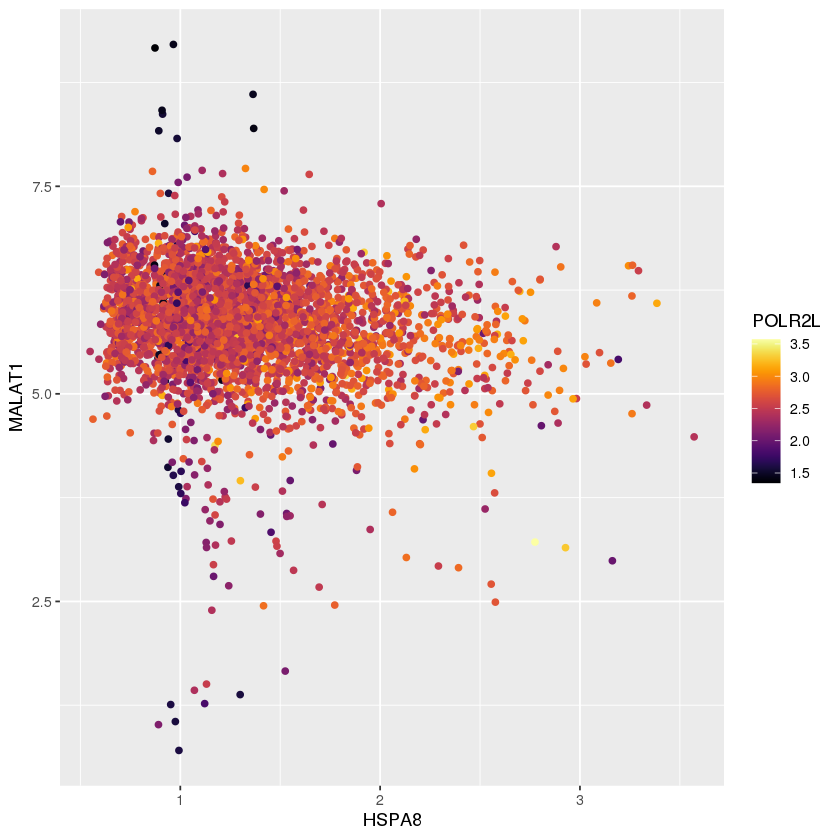

In [76]:
ggplot(data.frame(t(log(CL10P_imputation_result$estimate+1)))) +
  geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
  scale_color_viridis(option="B")

In [67]:
TSSRdf<-data.frame(CL10P_imputation_result$estimate)

In [74]:
TSSRdf[which(rownames(TSSRdf)=="HSPA8"),]

,AAACCTGAGGATATAC.CL1.0.P.4,AAACCTGAGGGTCTCC.CL1.0.P.4,AAACCTGCACATTTCT.CL1.0.P.4,AAACGGGGTCCCTACT.CL1.0.P.4,AAACGGGTCACCATAG.CL1.0.P.4,AAACGGGTCAGCACAT.CL1.0.P.4,AAACGGGTCTATCCCG.CL1.0.P.4,AAACGGGTCTGACCTC.CL1.0.P.4,AAAGATGAGAGGTTGC.CL1.0.P.4,AAAGATGAGCGGCTTC.CL1.0.P.4,...,TTTGGTTCAGGGTACA.CL1.0.P.4,TTTGGTTCATCTCCCA.CL1.0.P.4,TTTGGTTTCGGCTACG.CL1.0.P.4,TTTGTCAGTAATTGGA.CL1.0.P.4,TTTGTCAGTACATGTC.CL1.0.P.4,TTTGTCAGTCTCAACA.CL1.0.P.4,TTTGTCAGTGGCCCTA.CL1.0.P.4,TTTGTCAGTTACGACT.CL1.0.P.4,TTTGTCATCCATGAAC.CL1.0.P.4,TTTGTCATCTGGTTCC.CL1.0.P.4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HSPA8,2.82,1.537,4.7,3.395,3.156,0.927,2.203,2.028,1.053,4.157,...,3.812,2.027,1.861,5.596,1.972,2.635,1.734,1.647,2.456,2.509


## OverView

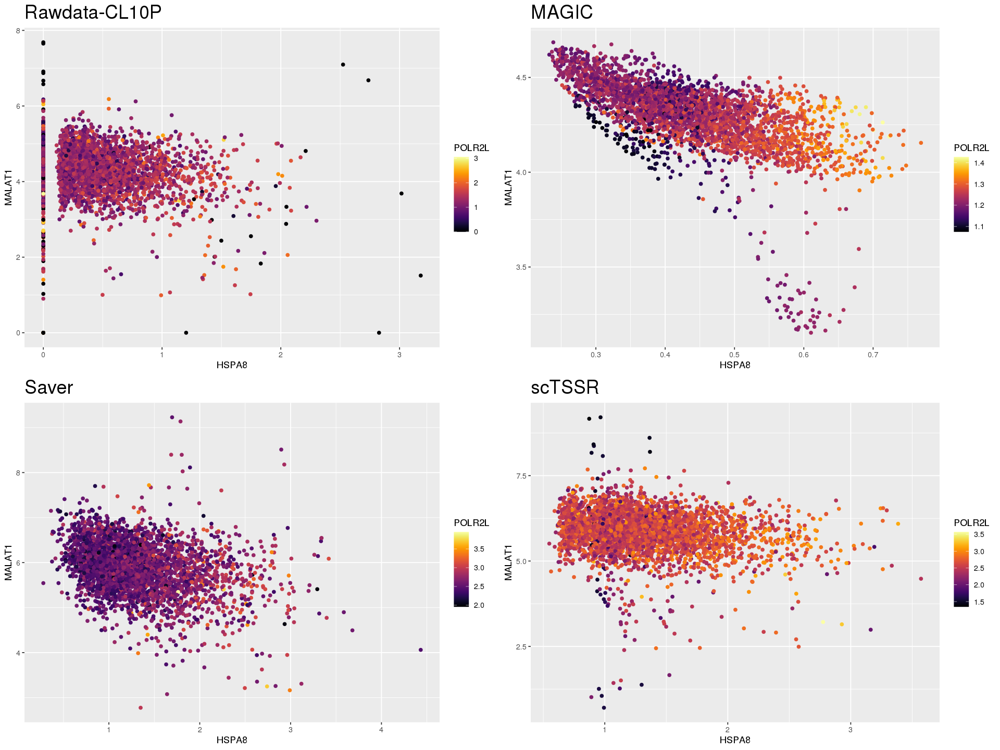

In [168]:
options(repr.plot.width=16, repr.plot.height=12)
plot_grid(ggplot(data.frame(t(scdata@assays$logCPM[Genelist, ]))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="Rawdata-CL10P"),
          ggplot(data.frame(data_MAGIC)) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="MAGIC"),
          ggplot(data.frame(t(log(cortex.saver$estimate[Genelist, ]+1)))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="Saver"),
          ggplot(data.frame(t(log(CL10P_imputation_result$estimate+1)))) +
          geom_point(aes(HSPA8, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="scTSSR"),
          ncol=2)

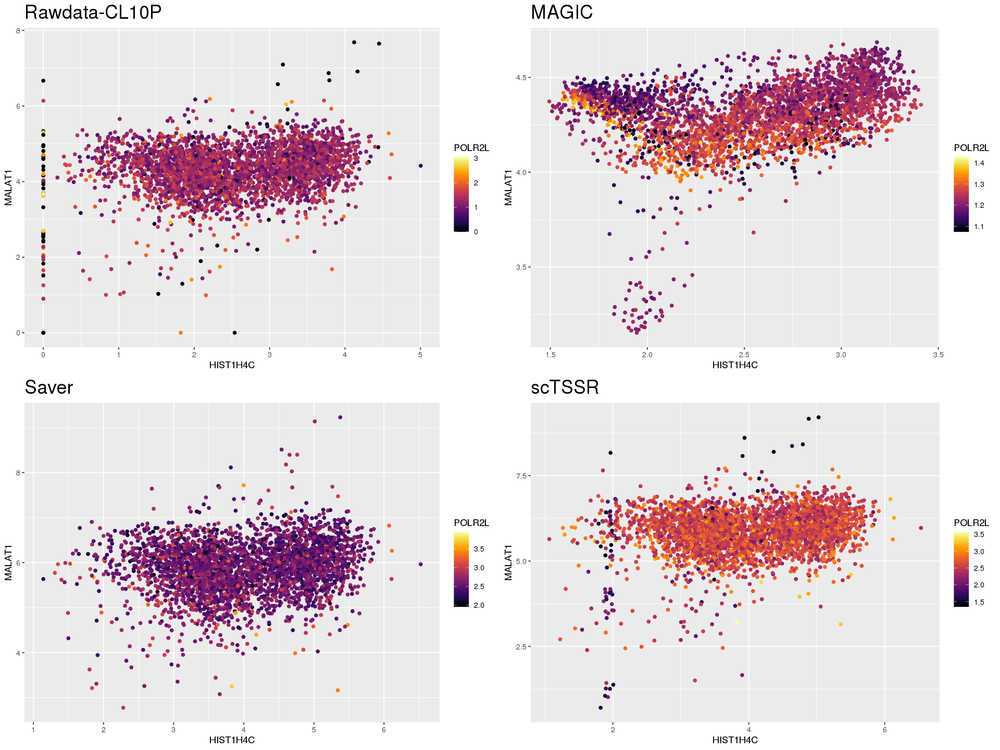

In [169]:
options(repr.plot.width=16, repr.plot.height=12)
plot_grid(ggplot(data.frame(t(scdata@assays$logCPM[Genelist, ]))) +
          geom_point(aes(HIST1H4C, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="Rawdata-CL10P"),
          ggplot(data.frame(data_MAGIC)) +
          geom_point(aes(HIST1H4C, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="MAGIC"),
          ggplot(data.frame(t(log(cortex.saver$estimate[Genelist, ]+1)))) +
          geom_point(aes(HIST1H4C, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="Saver"),
          ggplot(data.frame(t(log(CL10P_imputation_result$estimate+1)))) +
          geom_point(aes(HIST1H4C, MALAT1, color=POLR2L)) +
          scale_color_viridis(option="B") +
          theme(plot.title = element_text(size=22)) +
          labs(title="scTSSR"),
          ncol=2)